<a href="https://colab.research.google.com/github/PurraSujay/Computer-Vision-Projects/blob/main/image_processing_part_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#**COMPUTER VISION IMAGE PROCESING OPERATIONS !**

In [ ]:
!pip install opencv-python
import cv2
import matplotlib.pyplot as plt
import numpy as np
import warnings
warnings.filterwarnings('ignore')

**color mapping !**

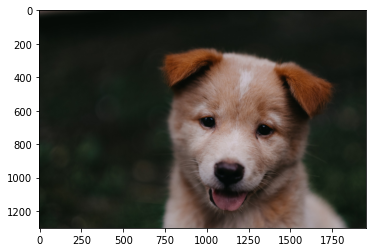

In [ ]:
img = cv2.imread('00-puppy.jpg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img)

converting to HSV

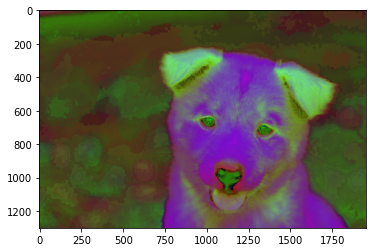

In [ ]:
img = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
plt.imshow(img)

converting to HLS

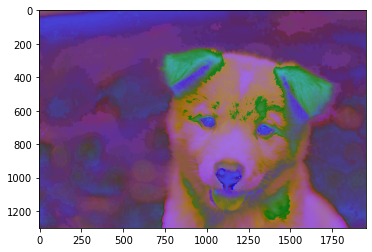

In [ ]:
img = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
plt.imshow(img)

Blending and Pasting Images

In [ ]:
# Two images
img1 = cv2.imread('dog_backpack.png')
img2 = cv2.imread('watermark_no_copy.png')

In [ ]:
img1.shape

(1401, 934, 3)

In [ ]:
img2.shape

(1280, 1277, 3)

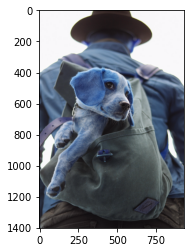

In [ ]:
plt.imshow(img1)

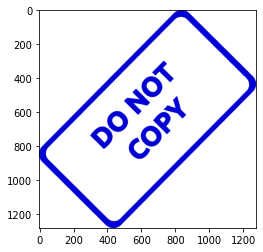

In [ ]:
plt.imshow(img2)

In [ ]:
img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

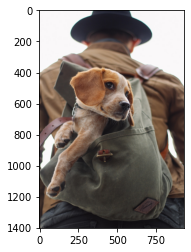

In [ ]:
plt.imshow(img1)

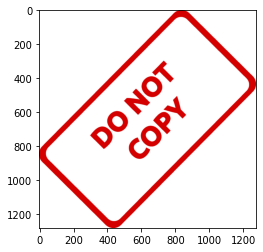

In [ ]:
plt.imshow(img2)

In [ ]:
#resizing
img1 =cv2.resize(img1,(1200,1200))
img2 =cv2.resize(img2,(1200,1200))

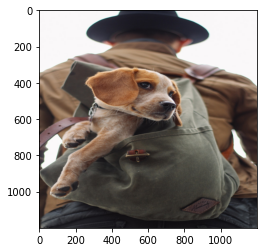

In [ ]:
plt.imshow(img1)

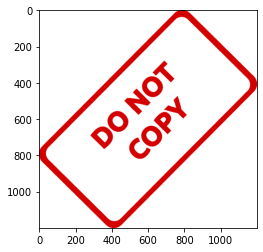

In [ ]:
plt.imshow(img2)

BLENDING THE IMAGES ... i.e mixing of 2 images !

In [ ]:
img1.shape

(1200, 1200, 3)

In [ ]:
img2.shape

(1200, 1200, 3)

In [ ]:
blended = cv2.addWeighted(src1=img1,alpha=0.7,src2=img2,beta=0.3,gamma=0)

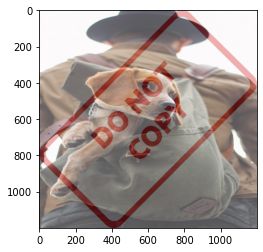

In [ ]:
plt.imshow(blended)

Overlaying Images of Different Sizes

In [ ]:
# Load two images
img1 = cv2.imread('dog_backpack.png')
img2 = cv2.imread('watermark_no_copy.png')
img2 =cv2.resize(img2,(600,600))

img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

large_img = img1
small_img = img2

In [ ]:
x_offset = 0
y_offset = 0

In [ ]:
large_img[y_offset:y_offset+small_img.shape[0], x_offset:x_offset+small_img.shape[1]] = small_img

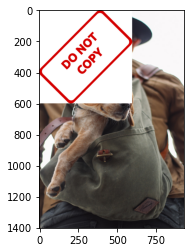

In [ ]:
plt.imshow(large_img)

Create a Region of Interest (ROI)

In [ ]:
img1.shape

(1401, 934, 3)

In [ ]:
x_offset=934-600
y_offset=1401-600

In [ ]:
# Creating an ROI of the same size of the foreground image (smaller image that will go on top)
rows,cols,channels = img2.shape
# roi = img1[0:rows, 0:cols ] # TOP LEFT CORNER
roi = img1[y_offset:1401,x_offset:943] # BOTTOM RIGHT CORNER

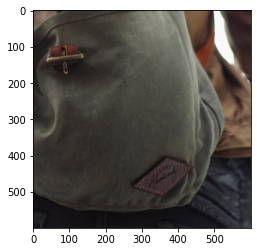

In [ ]:
plt.imshow(roi)

creating a mask


In [ ]:
# Now create a mask of logo and create its inverse mask also
img2gray = cv2.cvtColor(img2,cv2.COLOR_BGR2GRAY)

In [ ]:
img2gray.shape

(600, 600)

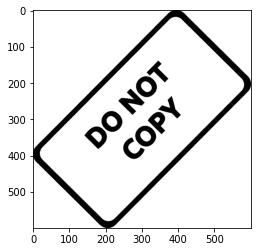

In [ ]:
plt.imshow(img2gray,cmap='gray')

In [ ]:
mask_inv = cv2.bitwise_not(img2gray)

In [ ]:
mask_inv.shape

(600, 600)

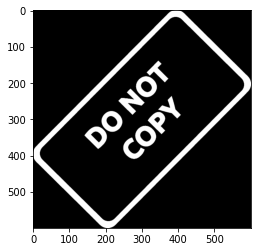

In [ ]:
plt.imshow(mask_inv,cmap='gray')

Convert Mask to have 3 channels

In [ ]:
white_background = np.full(img2.shape, 255, dtype=np.uint8)

In [ ]:
bk = cv2.bitwise_or(white_background, white_background, mask=mask_inv)

In [ ]:
bk.shape

(600, 600, 3)

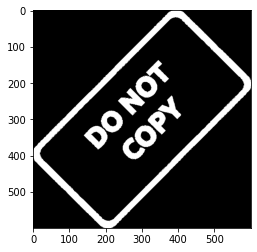

In [ ]:
plt.imshow(bk)

In [ ]:
fg = cv2.bitwise_or(img2, img2, mask=mask_inv)

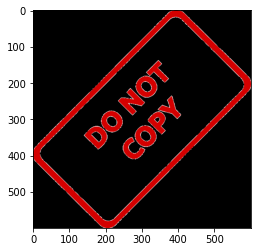

In [ ]:
plt.imshow(fg)

Get ROI and blend in the mask with the ROI

In [ ]:
final_roi = cv2.bitwise_or(roi,fg)

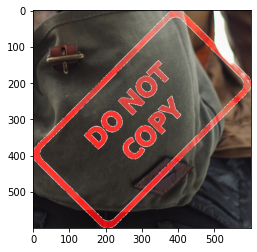

In [ ]:
plt.imshow(final_roi)

**IMAGE THRESHOLD !**

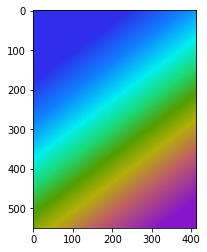

In [ ]:
image = cv2.imread('rainbow.jpg')
plt.imshow(image)

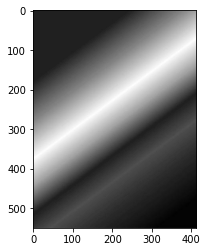

In [ ]:
image = cv2.imread('rainbow.jpg',0)  #0------> indicates gray color
plt.imshow(image,cmap='gray')

Different Threshold Types¶

BINARY

In [ ]:
ret,thresh1 = cv2.threshold(image,127,255,cv2.THRESH_BINARY)

In [ ]:
ret

127.0

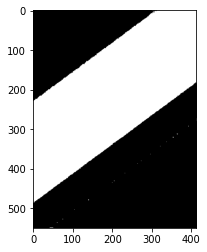

In [ ]:
plt.imshow(thresh1,cmap='gray')

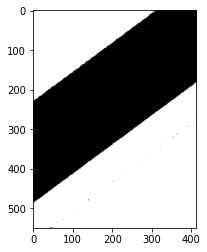

In [ ]:
#binary inverse
ret,thresh2 = cv2.threshold(image,127,255,cv2.THRESH_BINARY_INV)
plt.imshow(thresh2,cmap='gray')

Threshold Truncation

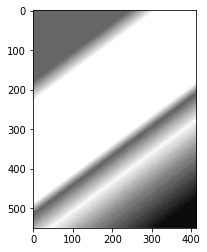

In [ ]:
ret,thresh3 = cv2.threshold(image,127,255,cv2.THRESH_TRUNC)
plt.imshow(thresh3,cmap='gray')

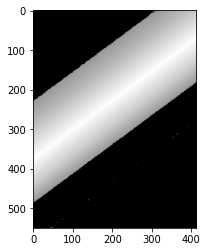

In [ ]:
ret,thresh4 = cv2.threshold(image,127,255,cv2.THRESH_TOZERO)
plt.imshow(thresh4,cmap='gray')

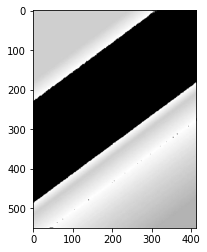

In [ ]:
ret,thresh5 = cv2.threshold(image,127,255,cv2.THRESH_TOZERO_INV)
plt.imshow(thresh5,cmap='gray')

# Real World Applications

## Adaptive Thresholding

In [ ]:
imgg = cv2.imread('crossword.jpg',0)

In [ ]:
def show_pic(imgg):
    fig = plt.figure(figsize=(15,15))
    ax = fig.add_subplot(111)
    ax.imshow(imgg,cmap='gray')

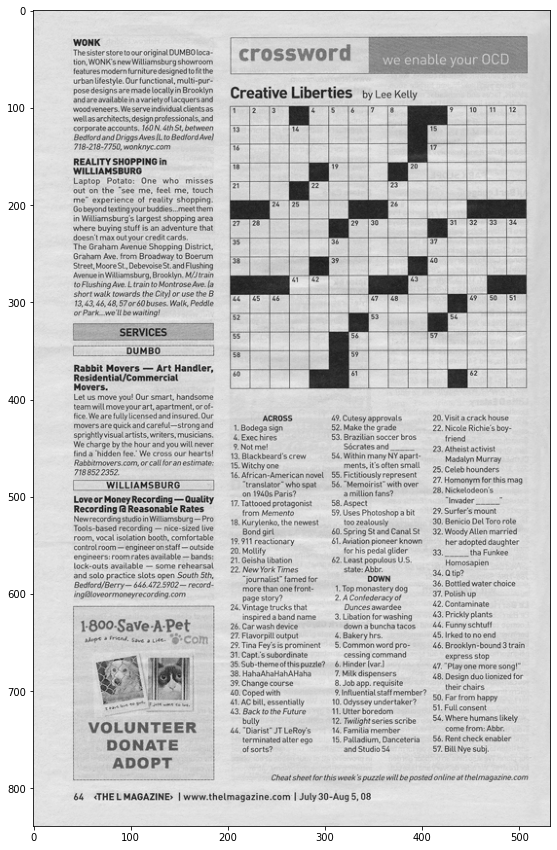

In [ ]:
show_pic(imgg)

simple binary

In [ ]:
ret,th1 = cv2.threshold(imgg,127,255,cv2.THRESH_BINARY)

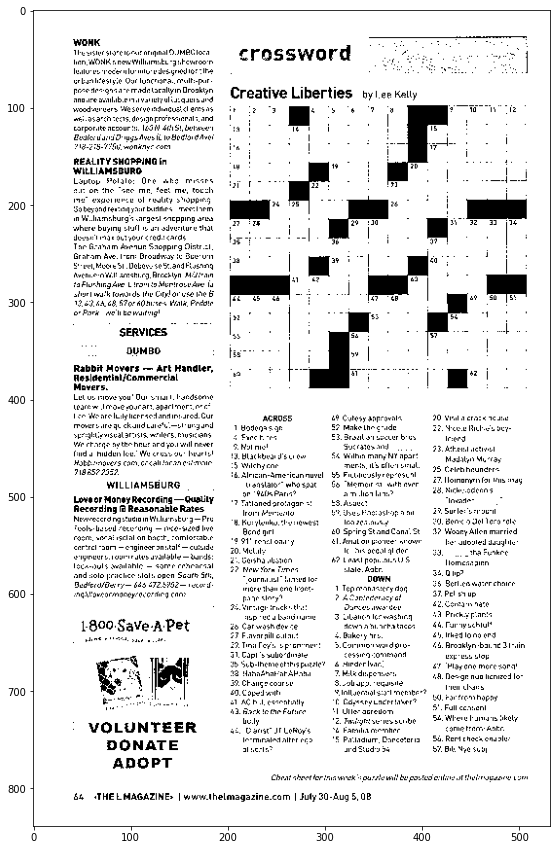

In [ ]:
show_pic(th1)

Adaptive Threshold

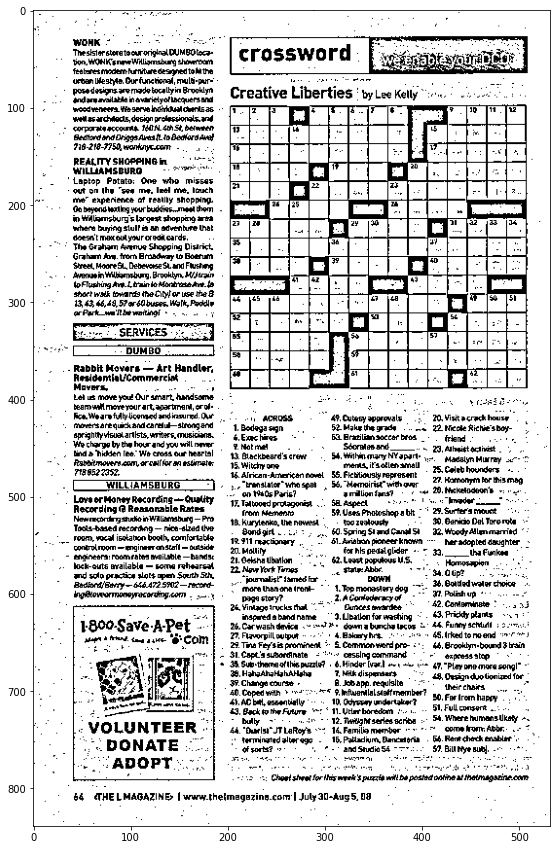

In [ ]:
th2 = cv2.adaptiveThreshold(imgg,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,11,8) # Play around with these last 2 numbers
show_pic(th2)

In [ ]:
th3 = cv2.adaptiveThreshold(imgg,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY,15,8)

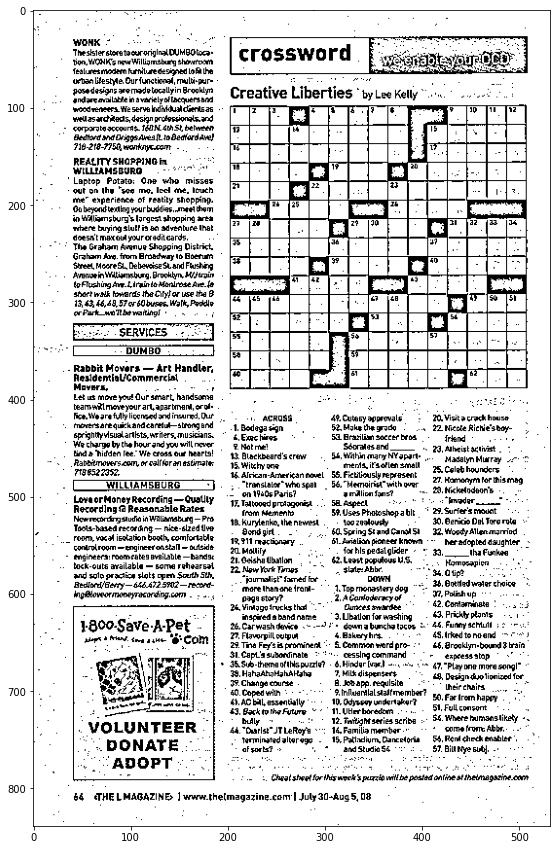

In [ ]:
show_pic(th3)

# **Blurring and Smoothing**

In [ ]:
def load_img():
    img1 = cv2.imread('bricks.jpg').astype(np.float32) / 255
    img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
    return img1

In [ ]:
def display_img(img1):
    fig = plt.figure(figsize=(12,10))
    ax = fig.add_subplot(111)
    ax.imshow(img1)

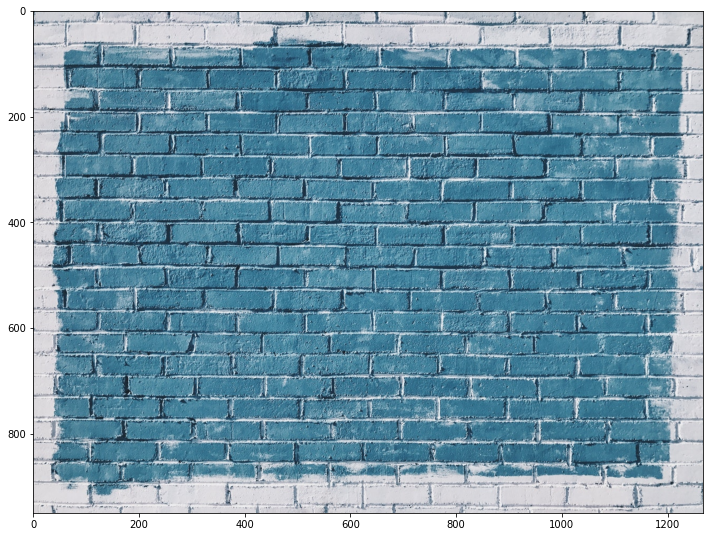

In [ ]:
i = load_img()
display_img(i)

Gamma Correction : Practical Effect of Increasing Brightness

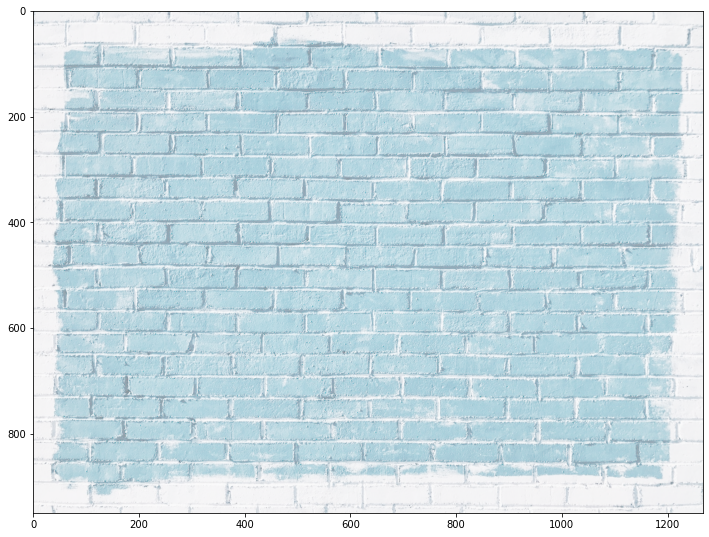

In [ ]:
img1 = load_img()
gamma = 1/4 #increases the brightness...
effected_image = np.power(img1, gamma)
display_img(effected_image)

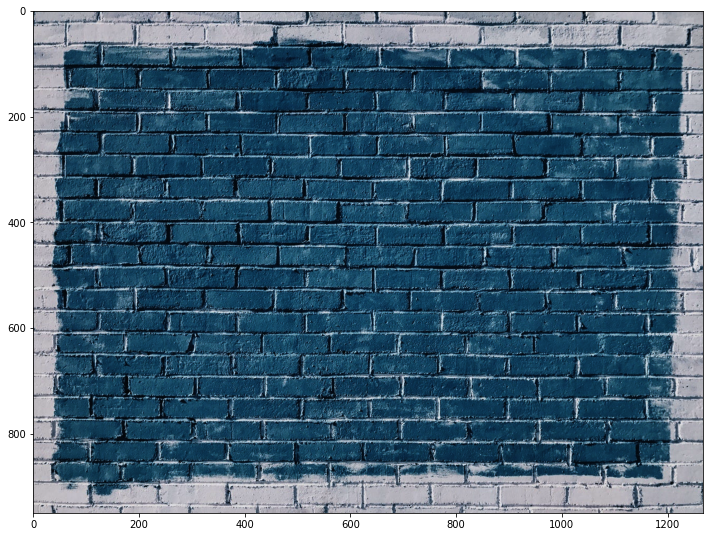

In [ ]:
img1 = load_img()
gamma = 2
effected_image = np.power(img1, gamma)
display_img(effected_image)

### Low Pass Filter with a 2D Convolution

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


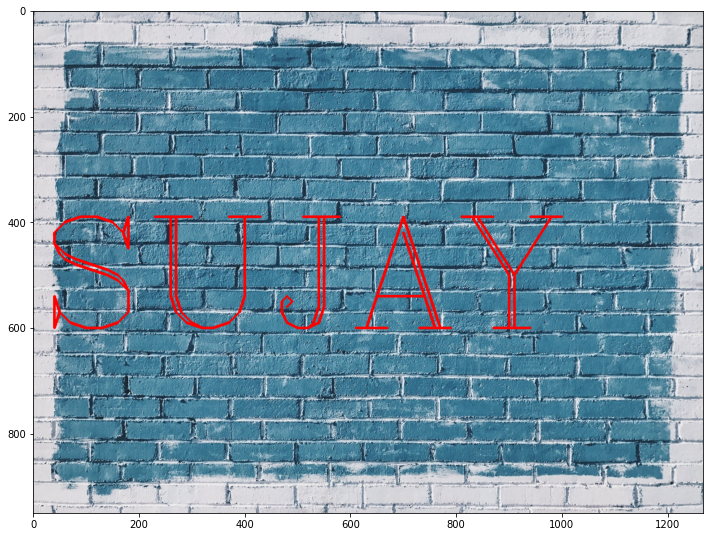

In [ ]:
img1 = load_img()
font = cv2.FONT_HERSHEY_COMPLEX
cv2.putText(img1,text='SUJAY',org=(10,600), fontFace=font,fontScale= 10,color=(255,0,0),thickness=4)
display_img(img1)

create the kernel !

In [ ]:
kernel = np.ones(shape=(5,5),dtype=np.float32)/25

In [ ]:
kernel

array([[0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04],
       [0.04, 0.04, 0.04, 0.04, 0.04]], dtype=float32)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


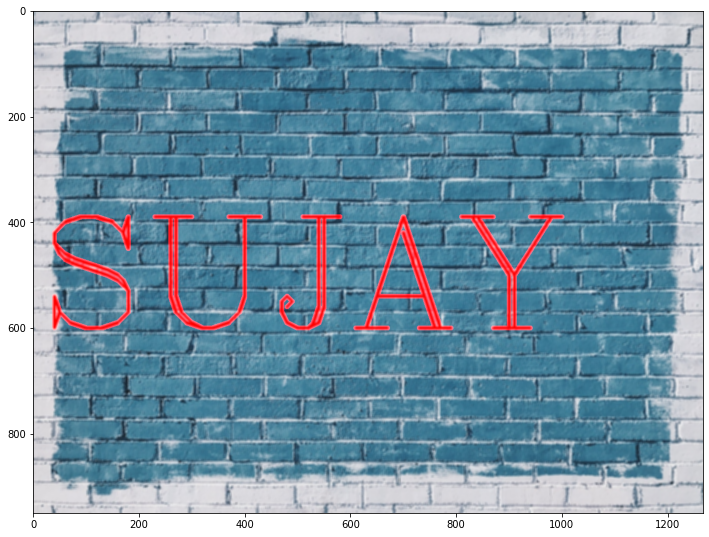

In [ ]:
dst = cv2.filter2D(img1,-1,kernel)
display_img(dst)

In [ ]:
blurred_img = cv2.blur(img1,ksize=(5,5))

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


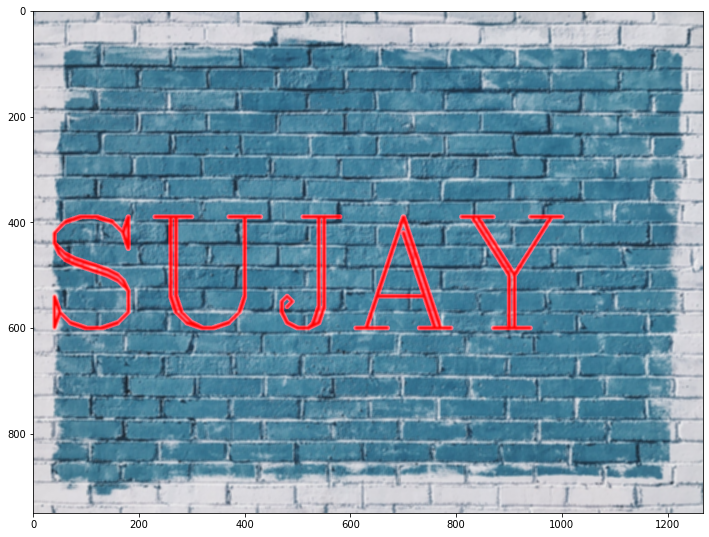

In [ ]:
display_img(blurred_img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


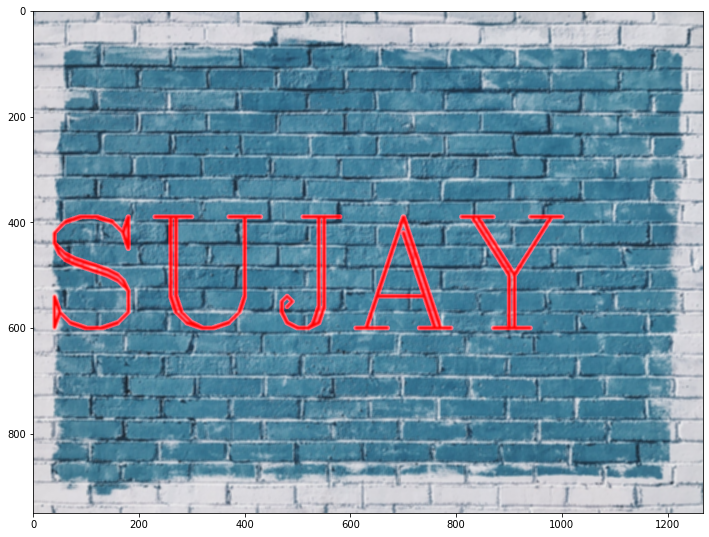

In [ ]:
blurred_img = cv2.GaussianBlur(img1,(5,5),10) #GaussianBlur
display_img(blurred_img)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


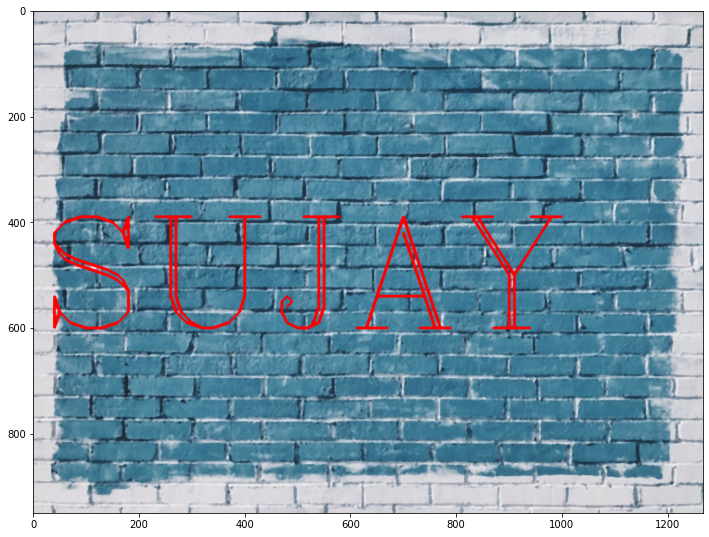

In [ ]:
median = cv2.medianBlur(img1,5) #MedianBlur
display_img(median)

ADDING NOISE !

In [ ]:
img2 = cv2.imread('sammy.jpg')
img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

In [ ]:
img2.min()

0

In [ ]:
img2.max()

255

In [ ]:
img2.shape

(1367, 1025, 3)

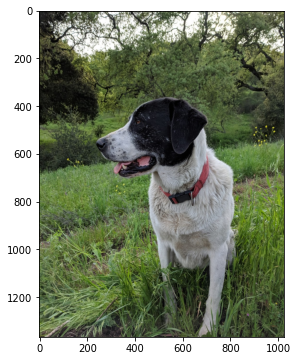

In [ ]:
plt.figure(figsize=(10,6))
plt.imshow(img2)

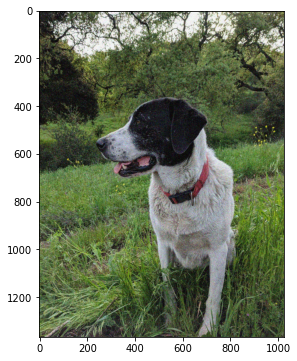

In [ ]:
noise_img = cv2.imread('sammy_noise.jpg')
plt.figure(figsize=(10,6))
plt.imshow(noise_img)

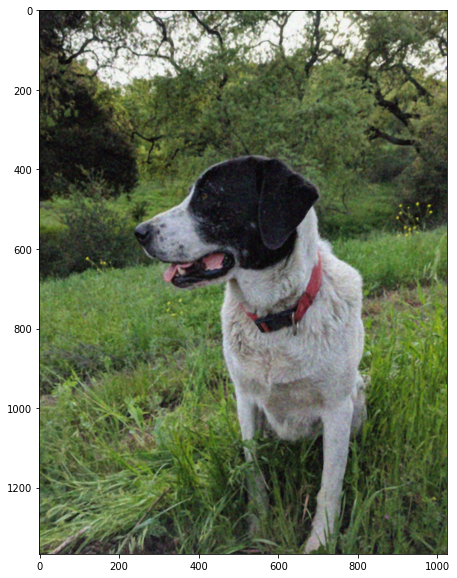

In [ ]:
median = cv2.medianBlur(noise_img,5)
display_img(median)

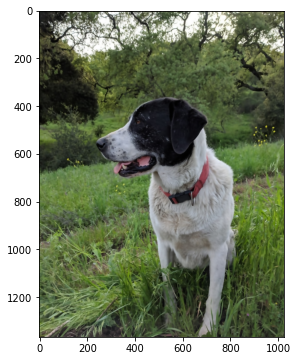

In [ ]:
blur2 = cv2.bilateralFilter(img2,9,75,75)
plt.figure(figsize=(10,6))
plt.imshow(blur2)